<a href="https://colab.research.google.com/github/Emie18/projetBDIAWEB/blob/main/Copie_de_Projet_IA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Projet IA groupe 1 trinôme 6
##Emilie Le Rouzic
##Gauthier Le Moal
##Hippolyte Requet

#Toutes les bibliothèques utilisées

In [53]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd
from datetime import datetime
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from scipy.spatial import distance
from collections import Counter
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import random
from sklearn.model_selection import LeaveOneOut
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

#Importation du fichier CSV

In [2]:
from google.colab import drive
drive.mount("/content/gdrive/")

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [6]:

data = pd.read_csv("/content/gdrive/MyDrive/Projet_IA/export_IA2.csv", delimiter =";")
print(type(data))

<class 'pandas.core.frame.DataFrame'>


#Étape 1

## Découverte des données :

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54795 entries, 0 to 54794
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                54795 non-null  int64  
 1   Num_Acc                   54795 non-null  int64  
 2   num_veh                   54795 non-null  object 
 3   id_usa                    54795 non-null  float64
 4   date                      54795 non-null  object 
 5   ville                     54795 non-null  object 
 6   id_code_insee             54795 non-null  object 
 7   latitude                  54795 non-null  object 
 8   longitude                 54795 non-null  object 
 9   descr_cat_veh             54795 non-null  object 
 10  descr_agglo               54795 non-null  object 
 11  descr_athmo               54795 non-null  object 
 12  descr_lum                 54795 non-null  object 
 13  descr_etat_surf           54795 non-null  object 
 14  descri

In [ ]:
data.head()

In [130]:
data["descr_grav"].value_counts()

1    40258
0    14537
Name: descr_grav, dtype: int64

convertion des latitudes et longitudes en float pour affichier la carte

In [7]:
data["latitude"] = data["latitude"].str.replace(',', '.')
data["latitude"] = data["latitude"].astype(float)
data["longitude"] = data["longitude"].str.replace(',', '.')
data["longitude"] = data["longitude"].astype(float)

###Affichage de la carte des accidents en fonction de leur gravité

In [8]:
fig = px.scatter_mapbox(data,
                 lat=data.latitude,
                 lon=data.longitude,
                 color = data.descr_grav)
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lon=2.554071, lat=46.603354),
        zoom=4
    ),
    title=dict(text="Carte des accidents en fonction de leur gravité", x=0.5)
)

fig.show()

☛ On peut remarquer que ce n'est pas bien lisible.

###Affichage d'histogrammes pour visualisé les données

In [9]:
dreg = data['age'] + 14 # Réglage des âges

fig1 = px.histogram(data['descr_grav'], x="descr_grav")
fig1.update_layout(title ='Nombre d\'accident en fonction de sa gravité', xaxis_title ="Gravité de l'accident", yaxis_title="Nombre d'accidents") 
fig1.show()

fig2 = px.histogram(data['descr_lum'], x="descr_lum")
fig2.update_layout(title ='Nombre d\'accident en fonction de la luminosité', xaxis_title ="Luminosité lors de l'accident", yaxis_title="Nombre d'accidents") 
fig2.show()


fig3 = px.histogram(dreg,  nbins=8,  x="age")
fig3.update_layout(
    title ='Nombre d\'accident en fonction de chaque tranche d\'âge',
    xaxis_title= 'Tranche d\'âge',
    yaxis_title="Nombre d'accidents"
)
fig3.show()

## Préparation des données :

### modifier la base de donnée pour avec seulement 2 type de gravités


In [10]:
data['descr_grav'] = data['descr_grav'].replace({
    'Indemne': 'pas grave',
    'Blessé léger': 'pas grave',
    'Blessé hospitalisé': 'grave',
    'Tué': 'grave'
})

###Convertir avec label encoder les descriptions

In [11]:
from sklearn.preprocessing import LabelEncoder
# Liste des colonnes à convertir
columns_to_convert = ["descr_agglo","num_veh", "descr_cat_veh","descr_athmo","descr_lum","descr_etat_surf","id_code_insee","description_intersection","descr_dispo_secu","descr_dispo_secu","descr_grav","ville","descr_motif_traj","descr_type_col"]

# Création de l'objet OrdinalEncoder
le = LabelEncoder()
for var in columns_to_convert:
      data[var] = le.fit_transform(data[var])

###Convertir de la date en datetime

fonction pour créer trois colone pour séparer les jour, mois,heure :


In [12]:
def create_date_and_time_columns(data, column):
# Extraction du jour, du mois et de l'heure
    data['Jour'] = data[column].dt.day
    data['Mois'] = data[column].dt.month
    data['Heure'] = data[column].dt.strftime('%H.%M').astype(float)

    # Suppression de la colonne de date et heure d'origine
    data.drop(column, axis=1, inplace=True)
    return data


In [13]:
data['date'] = pd.to_datetime(data['date'])
data=create_date_and_time_columns(data,'date')

vérification pour voir les types de chaques colones
☛ Il faut soit des int soit des float

In [129]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54795 entries, 0 to 54794
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                54795 non-null  int64  
 1   Num_Acc                   54795 non-null  int64  
 2   num_veh                   54795 non-null  int64  
 3   id_usa                    54795 non-null  float64
 4   ville                     54795 non-null  int64  
 5   id_code_insee             54795 non-null  int64  
 6   latitude                  54795 non-null  float64
 7   longitude                 54795 non-null  float64
 8   descr_cat_veh             54795 non-null  int64  
 9   descr_agglo               54795 non-null  int64  
 10  descr_athmo               54795 non-null  int64  
 11  descr_lum                 54795 non-null  int64  
 12  descr_etat_surf           54795 non-null  int64  
 13  description_intersection  54795 non-null  int64  
 14  an_nai

#Étape 2
## *Apprentissage supervisé*

##Matrice de corrélation

In [14]:
#création de la matrice de corrélation
corr_matrix = data.corr()

###Avant reduction de dimentionalité

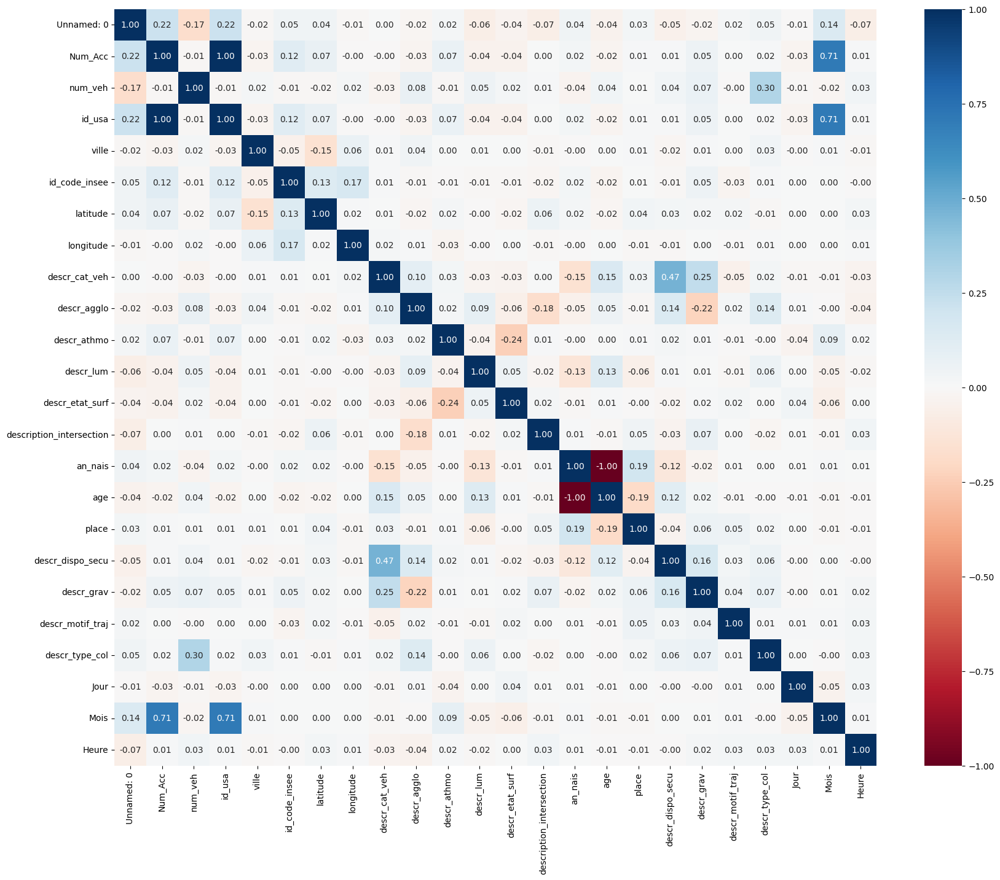

In [15]:
# Configuration de la taille du graphique
plt.figure(figsize=(20, 16))

# Affichage de la matrice de corrélation avec des pourcentages
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="RdBu")

# Affichage du graphique
plt.show()

☛ On regarde le tableau ci-dessus et on choisit les colones qui nous paraissent les plus importantes.


###Reduction de dimentionalité

In [16]:
columns_to_keep = ['descr_grav', 'latitude', 'longitude', 'descr_cat_veh',
                       'descr_agglo', 'descr_athmo', 'descr_lum', 'descr_etat_surf',
                       'descr_type_col','descr_dispo_secu']
data = data[columns_to_keep]

###Création d'un jeux de donnée moins grand pour après

In [17]:
sample_data = data.sample(n=1000, random_state=42)
sample_data.info()
sample_data.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 24510 to 17115
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   descr_grav        1000 non-null   int64  
 1   latitude          1000 non-null   float64
 2   longitude         1000 non-null   float64
 3   descr_cat_veh     1000 non-null   int64  
 4   descr_agglo       1000 non-null   int64  
 5   descr_athmo       1000 non-null   int64  
 6   descr_lum         1000 non-null   int64  
 7   descr_etat_surf   1000 non-null   int64  
 8   descr_type_col    1000 non-null   int64  
 9   descr_dispo_secu  1000 non-null   int64  
dtypes: float64(2), int64(8)
memory usage: 85.9 KB


,descr_grav,latitude,longitude,descr_cat_veh,descr_agglo,descr_athmo,descr_lum,descr_etat_surf,descr_type_col,descr_dispo_secu
24510,1,45.4000,4.08333,21,1,3,4,7,2,14
48785,0,48.9500,1.81667,21,1,3,3,7,0,14
13032,1,48.1833,6.45000,4,1,4,0,7,3,14
12510,1,43.1833,3.00000,21,0,3,4,7,3,14
13619,1,48.0833,-1.68333,21,0,3,1,7,3,7


###Après redution de dimentionalité


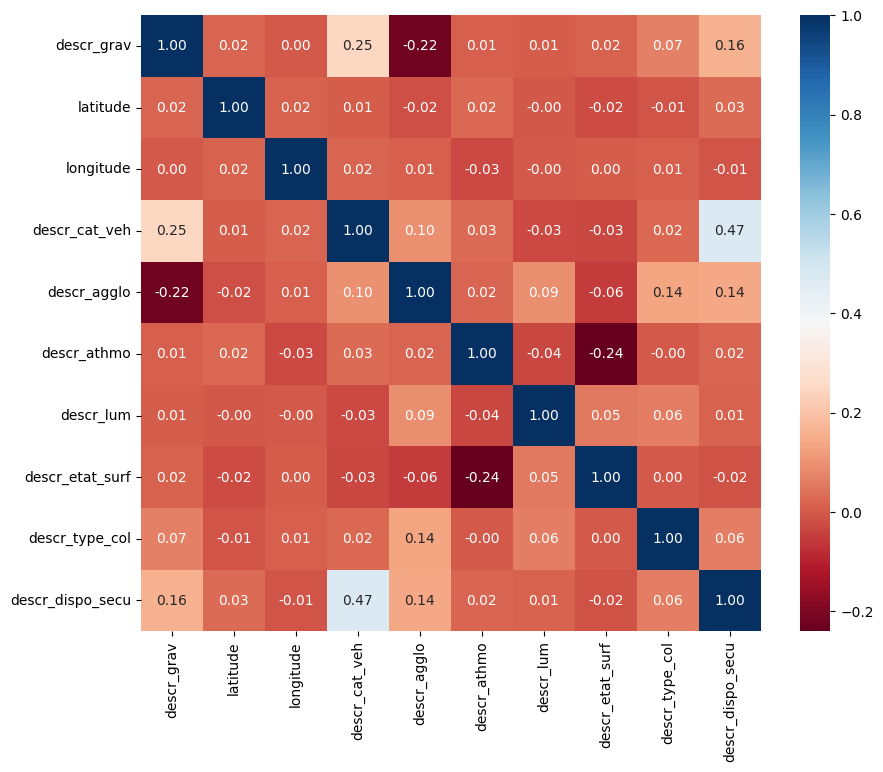

In [18]:
corr_matrix_2 = data.corr()
# Configuration de la taille du graphique
plt.figure(figsize=(10, 8))

# Affichage de la matrice de corrélation avec des pourcentages
sns.heatmap(corr_matrix_2, annot=True, fmt=".2f", cmap="RdBu")

# Affichage du graphique
plt.show()

☛ On obtient une visualisation plus propre et lisible de la matrice de corrélation

☛ ici la colone la plus corréler même si cela reste faible est la description de la catégorie du véhicule


##Clustering

###Partitionnement (clustering) : méthode "from scratch"

In [19]:
def l1(p1, p2):
    return np.sum(np.abs(p1 - p2))

def l2(p1, p2):
    return np.sqrt(np.sum(np.square(p1 - p2)))

def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371.0  # Rayon moyen de la Terre en kilomètres
    
    # Conversion des latitudes/longitudes en radians
    lat1_rad = radians(lat1)
    lon1_rad = radians(lon1)
    lat2_rad = radians(lat2)
    lon2_rad = radians(lon2)
    
    dlon = lon2_rad - lon1_rad
    dlat = lat2_rad - lat1_rad
    
    a = sin(dlat / 2)**2 + cos(lat1_rad) * cos(lat2_rad) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    
    distance = R * c
    return distance

def kmeans_clustering(data, k, distance='l2', max_iterations=20):
    # Initialisation
    centroids = data[np.random.choice(range(len(data)), size=k, replace=False)]
    clusters = np.zeros(len(data))

    # Conversion des coordonnées en radians pour la distance Haversine
    data_rad = np.radians(data)
    centroids_rad = np.radians(centroids)

    # Définition de la fonction de distance
    if distance == 'l1':
        distance_func = l1
    elif distance == 'haversine':
        distance_func = lambda point1, point2: haversine_distance(*point1, *point2)
    else:
        distance_func = l2

    # Boucle principale
    for _ in range(max_iterations):
        # Attribution des points aux clusters les plus proches
        for i, point in enumerate(data_rad):
            distances = [distance_func(point, centroid) for centroid in centroids_rad]
            cluster = np.argmin(distances)
            clusters[i] = cluster

        #Mise à jour des centroïdes
        old_centroids = np.copy(centroids)
        for cluster in range(k):
            cluster_points = data[clusters == cluster]
            centroids[cluster] = np.median(cluster_points, axis=0)

        # Vérification de la convergence des centroïdes
        if np.array_equal(centroids, old_centroids):
            break
            
    return clusters

####Cartes avec les cluster et les centroïdes avec la fonction from scrach

In [20]:
coordonnees = np.array(data[['latitude', 'longitude']])
nb_cluster = [3, 4, 6]

for k in nb_cluster :

  # Clustering avec distance L1
  clusters_l1 = kmeans_clustering(coordonnees, k, distance='l1')
  print("Clustering avec distance L1 :", clusters_l1)

  centroids_l1 = np.zeros((k, 2))
  for cluster in range(k):
    cluster_points = coordonnees[clusters_l1 == cluster]
    centroids_l1[cluster] = np.mean(cluster_points, axis=0)

  # Création du DataFrame contenant les coordonnées des points et les clusters
  df1 = pd.DataFrame(coordonnees, columns=['latitude', 'longitude'])
  df1['cluster'] = clusters_l1

  # Affichage des clusters sur la carte
  fig1 = px.scatter_mapbox(df1, lat='latitude', lon='longitude', color='cluster', title=f'Carte {k} clusters distance de Manhattan')
  fig1.update_layout(        mapbox=dict(
            style='open-street-map',
            center=dict(lon=2.554071, lat=46.603354), 
            zoom=4 
        ))

  for i in range(k):
    centroid_lat, centroid_lon = centroids_l1[i]
    fig1.add_trace(go.Scattermapbox(
        lat=[centroid_lat],
        lon=[centroid_lon],
        mode='markers',
        marker=dict(size=10, color='red'),
        name=f'Centroid {i+1}'
    ))
  # Affichage de la figure
  fig1.show()

  # Clustering avec distance L2
  clusters_l2 = kmeans_clustering(coordonnees, k, distance='l2')
  print("Clustering avec distance L2 :", clusters_l2)

  centroids_l2 = np.zeros((k, 2))
  for cluster in range(k):
    cluster_points = coordonnees[clusters_l2 == cluster]
    centroids_l2[cluster] = np.mean(cluster_points, axis=0)

  # Création du DataFrame contenant les coordonnées des points et les clusters
  df2 = pd.DataFrame(coordonnees, columns=['latitude', 'longitude'])
  df2['cluster'] = clusters_l2

  # Affichage des clusters sur la carte
  fig2 = px.scatter_mapbox(df2, lat='latitude', lon='longitude', color='cluster', title=f'Carte {k} clusters distance Euclidienne')
  fig2.update_layout(        mapbox=dict(
            style='open-street-map',
            center=dict(lon=2.554071, lat=46.603354), 
            zoom=4 
        ))

  for i in range(k):
    centroid_lat, centroid_lon = centroids_l2[i]
    fig2.add_trace(go.Scattermapbox(
        lat=[centroid_lat],
        lon=[centroid_lon],
        mode='markers',
        marker=dict(size=10, color='red'),
        name=f'Centroid {i+1}'
    ))

  # Affichage de la figure
  fig2.show()

  # Clustering avec distance Haversine
  clusters_haversine = kmeans_clustering(coordonnees, k, distance='haversine')
  print("Clustering avec distance Haversine :", clusters_haversine)

  centroids_haversine = np.zeros((k, 2))
  for cluster in range(k):
    cluster_points = coordonnees[clusters_haversine == cluster]
    centroids_haversine[cluster] = np.mean(cluster_points, axis=0)

  # Création du DataFrame contenant les coordonnées des points et les clusters
  df3 = pd.DataFrame(coordonnees, columns=['latitude', 'longitude'])
  df3['cluster'] = clusters_haversine

  # Affichage des clusters sur la carte
  fig3 = px.scatter_mapbox(df3, lat='latitude', lon='longitude', color='cluster', title=f'Carte {k} clusters distance Haversine')
  fig3.update_layout(        mapbox=dict(
            style='open-street-map',
            center=dict(lon=2.554071, lat=46.603354), 
            zoom=4 
        ))

  for i in range(k):
    centroid_lat, centroid_lon = centroids_haversine[i]
    fig3.add_trace(go.Scattermapbox(
        lat=[centroid_lat],
        lon=[centroid_lon],
        mode='markers',
        marker=dict(size=10, color='red'),
        name=f'Centroid {i+1}'
    ))

  # Affichage de la figure
  fig3.show()

Clustering avec distance L1 : [2. 0. 0. ... 1. 1. 1.]


Clustering avec distance L2 : [1. 0. 0. ... 0. 0. 0.]


Clustering avec distance Haversine : [1. 1. 1. ... 0. 0. 0.]


Clustering avec distance L1 : [2. 0. 0. ... 2. 2. 2.]


Clustering avec distance L2 : [2. 0. 0. ... 1. 1. 1.]


Clustering avec distance Haversine : [0. 1. 1. ... 3. 3. 3.]


Clustering avec distance L1 : [5. 3. 3. ... 0. 0. 0.]


Clustering avec distance L2 : [1. 5. 5. ... 5. 5. 5.]


Clustering avec distance Haversine : [4. 1. 1. ... 3. 3. 3.]


### Partitionnement (clustering) : méthode "scikit-learn"

In [22]:
nb_cluster = [3, 4, 6]
for k in nb_cluster:
    kmean = KMeans(n_clusters=k)

    data_filtered = data.drop(data[(data['latitude'] == 0) & (data['longitude'] == 0)].index)
    
    X = data_filtered.loc[:, ['latitude', 'longitude']]

    X = X.drop(X[(X['latitude'] == 0) & (X['longitude'] == 0)].index)

    y_predict = kmean.fit_predict(X)

    fig = px.scatter_mapbox(
        X,
        lat=X.latitude,
        lon=X.longitude,
        color=y_predict
    )
    
    centroids = kmean.cluster_centers_

    fig.add_trace(
        go.Scattermapbox(
            lat=centroids[:, 0],
            lon=centroids[:, 1],
            mode='markers',
            marker=dict(size=10, color='red'),
            name='Cluster Centroids'
        )
    )
    
    fig.update_layout(
        mapbox=dict(
            style='open-street-map',
            center=dict(lon=2.554071, lat=46.603354), 
            zoom=4 
        ),
        title=dict(text=f"Carte {k} clusters avec la méthode Scikit-learn", x=0.5)
    )

    fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



# Étape 3
## *Apprentissage supervisé*

## Répartition des données :

In [24]:
from sklearn.model_selection import train_test_split

def holdout_split(data, target, test_size=0.2, random_state=42):
    X = data.drop(target, axis=1)
    y = data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

In [25]:
from sklearn.model_selection import LeaveOneOut
import random

def leave_one_out_split(data, target):
    X = data.drop(target, axis=1)
    y = data[target]
    loo = LeaveOneOut()
    loo.get_n_splits(X)
    size = len(data)
    stop = random.randint(0, size)
    i=0
    for i, (train_index, test_index) in enumerate(loo.split(X)):
      if(i==stop):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        break
    print("ligne isolé aléatoirement:",i)
    return X_train,X_test,y_train,y_test


In [39]:
X_train_h, X_test_h, y_train_h, y_test_h = holdout_split(data, 'descr_grav')

In [27]:
X_train_l, X_test_l, y_train_l, y_test_l = leave_one_out_split(data, 'descr_grav')

ligne isolé aléatoirement: 24133


In [28]:
print(X_train_h.shape)

(43836, 9)


In [156]:
print(X_train_l.shape)

(999, 9)


In [157]:
X_train_l.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999 entries, 24510 to 17115
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   latitude          999 non-null    float64
 1   longitude         999 non-null    float64
 2   descr_cat_veh     999 non-null    int64  
 3   descr_agglo       999 non-null    int64  
 4   descr_athmo       999 non-null    int64  
 5   descr_lum         999 non-null    int64  
 6   descr_etat_surf   999 non-null    int64  
 7   descr_type_col    999 non-null    int64  
 8   descr_dispo_secu  999 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 78.0 KB


## Classification avec KNN

### Classification KNN from "scratch"

fonction qui va renvoyer les k les plus proches

In [29]:
def euclidean_distance(x1, x2):
    #return x1 - x2
    x1 = np.array(x1,dtype=np.float64)
    x2 = np.array(x2,dtype=np.float64)
    return np.sqrt(np.sum(np.square(x1 - x2)))
    #return distance.euclidean(x1, x2)
class KNN:
    def __init__(self, k):
        self.k = k
    
    def fit(self, X, y):
        self.X_train = X
        self.y_train = y
    
    def predict(self, X):
        y_pred = [self._predict(x) for x in X]
        return np.array(y_pred)
    
    def _predict(self, x):
        # Calculer les distances entre x et tous les exemples d'apprentissage
        distances = [euclidean_distance(x, x_train) for x_train in self.X_train]
        print("distance:",distances)
        # Trier les distances et obtenir les indices des k plus proches voisins
        k_indices = np.argsort(distances)[:self.k]
        print("indice:",k_indices)
        print("xtrain:",self.X_train[k_indices])
        # Extraire les étiquettes des k plus proches voisins
        k_nearest_labels = [self.y_train[i] for i in k_indices]
        # Retourner l'étiquette majoritaire parmi les k plus proches voisins
        most_common = Counter(k_nearest_labels).most_common()
        return most_common

On utilise notre classe KNN sur notre jeux de donné leave one out (X_train_l...) pour avoir le moins de calcul possible.

In [30]:
# Création de l'objet KNN avec k=3
knn = KNN(k=3)
# Ajustement du modèle aux données d'entraînement
knn.fit(X_train_l.values, y_train_l.values)

In [31]:
# Prédictions sur les données de test
y_pred_l = knn.predict(X_test_l.values)

# Affichage des k plus proches du premier
print("xtest:",y_pred_l[0])
#affiche la dernière colone: le type de colision
print("type de colision des k plus proche:")
print(le.inverse_transform(y_pred_l[0][0]))

distance: [7.108140266312208, 20.578203527033377, 19.709451042583833, 19.341208214328518, 18.181708336830066, 19.13360319644183, 18.419499174424068, 18.075226398182927, 18.827381076211555, 18.456214683557295, 18.456214683557295, 18.457375796111673, 7.653067671856103, 17.73873917434858, 17.95854800799764, 17.83076309609011, 20.498516911691173, 18.276181838088856, 18.584880659976513, 6.898325201815945, 7.376555469188109, 18.983609248243837, 19.75655609139227, 19.623833941041415, 19.67430190321601, 17.396785035715336, 17.874226491764308, 18.827850984084428, 6.155507866040704, 9.104409760598925, 18.318092149566233, 18.847929466006498, 17.773677480726633, 18.009460954700696, 17.803382764114126, 19.877793245618815, 20.055188064189498, 18.941386290049866, 12.15522530665594, 18.02149041780088, 11.390565179130006, 17.90546625043749, 18.314235312728975, 18.9288888383753, 19.83186407415019, 19.146838325919216, 19.146838325919216, 19.423760117444022, 19.709739673319103, 18.969640654096985, 18.3374

visualisation de la ligne X_test_l pour comparer les k proche trouvé précedemment.

In [32]:
print(X_test_l.values)

[[49.05     -0.966667  4.        0.        1.        0.        7.
   2.       11.      ]]


☛ On peut maintenant comparer les k plus proches renvoyer.

<font color="red">On ne fait pas la méthode KKN que nous avons créer sur le jeux de donnée holdout car cela prend trop de temps</font>



In [33]:
###Trop long
#knn = KNN(k=5)
#knn.fit(X_train_h.values, y_train_h.values)
#y_pred_h = knn.predict(X_test_h.values)
#print(y_pred_h)

###KNN SKlearn

fonction qui renvoit en fonction du numéro en entré si c'est grave ou pas.


 1 : pas grave

 0 : grave

In [34]:
def grave_ou_pas(nb):
  if nb==1:
    return 'pas grave'
  if nb==0:
    return 'grave'

####KNN sur les bases du holdout

In [44]:
# Création de l'objet KNeighborsClassifier avec k=5
knn_SK_h = KNeighborsClassifier(n_neighbors=5)

# Ajustement du modèle aux données d'entraînement
knn_SK_h.fit(X_train_h, y_train_h)

# Prédictions sur les données de test
y_pred_SK_h = knn_SK_h.predict(X_test_h)

# Affichage des prédictions
print("Prédictions:",y_pred_SK_h)

Prédictions: [1 1 1 ... 1 1 1]


####Accuracy score avec les bases du holdout

In [45]:
# Calcul de l'accuracy
accuracy = accuracy_score(y_test_h, y_pred_SK_h)

# Affichage de l'accuracy
print("Accuracy:", accuracy)


Accuracy: 0.7707820056574505


####KNN sur la base leave one out 

In [46]:
import random

def leave_one_out_knn(data, target, k=5):
    X = data.drop(target, axis=1)
    y = data[target]
    loo = LeaveOneOut()
    loo.get_n_splits(X)
    size = len(data)
    accuracy_scores = []

    for train_index, test_index in loo.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        y_pred = knn.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

    average_accuracy = sum(accuracy_scores) / len(accuracy_scores)

    return accuracy_scores, average_accuracy


####Affiche l'accuracy et les prédiction du KNN sur le leave one out


In [47]:
# Utilisation de la fonction leave_one_out_knn avec votre DataFrame
y_preds, avg_accuracy = leave_one_out_knn(data.sample(n=2000, random_state=42), 'descr_grav')
# Affichage des résultats
print("Prédictions:", y_preds)
print("Moyenne de l'accuracy score:", avg_accuracy)

Prédictions: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

## Classification avec trois algorithmes de « haut niveau »

### Support Vector Machine (SVM)
### Random Forest (RF)
### Multilayer Perceptron (MLP)


In [49]:
# Définition des hyperparamètres à tester pour chaque modèle
svm_param_grid = {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']}
rf_param_grid = {'n_estimators': [100, 200, 300], 'max_depth': [None, 5, 10,15,20], 'min_samples_split': [2, 5, 10]}
mlp_param_grid = {'hidden_layer_sizes': [(100,), (50, 50), (30, 30, 30)], 'activation': ['relu', 'tanh'], 'solver': ['sgd', 'adam'], 'alpha': [0.0001, 0.001, 0.01, 0.1]}

# Création des classifieurs individuels
svm_clf = SVC(probability=True)
rf_clf = RandomForestClassifier()
mlp_clf = MLPClassifier(max_iter=600)

# Création des objets GridSearchCV pour la recherche des meilleurs paramètres
svm_grid = GridSearchCV(svm_clf, svm_param_grid)
rf_grid = GridSearchCV(rf_clf, rf_param_grid)
mlp_grid = GridSearchCV(mlp_clf, mlp_param_grid)

On utilise la fonction holout_split avec la base de donnée réduite pour reduire le temps d'apprentissage.

In [50]:
X_train_h, X_test_h, y_train_h, y_test_h = holdout_split(sample_data, 'descr_grav')

###Apprentissage des données

In [51]:
# Entraînement des modèles sur les données d'apprentissage
svm_grid.fit(X_train_h, y_train_h)
rf_grid.fit(X_train_h, y_train_h)
mlp_grid.fit(X_train_h, y_train_h)

GridSearchCV(estimator=MLPClassifier(max_iter=600),
             param_grid={'activation': ['relu', 'tanh'],
                         'alpha': [0.0001, 0.001, 0.01, 0.1],
                         'hidden_layer_sizes': [(100,), (50, 50), (30, 30, 30)],
                         'solver': ['sgd', 'adam']})

###Prédiction des données
###Évaluation des performances des modèle et de la précision des prédictions positives.

In [52]:
# Prédiction sur les données de test
y_pred_svm = svm_grid.predict(X_test_h)
y_pred_rf = rf_grid.predict(X_test_h)
y_pred_mlp = mlp_grid.predict(X_test_h)

# Évaluation des performances des modèles individuels
accuracy_svm = accuracy_score(y_test_h, y_pred_svm)
accuracy_rf = accuracy_score(y_test_h, y_pred_rf)
accuracy_mlp = accuracy_score(y_test_h, y_pred_mlp)

precision_svm = precision_score(y_test_h, y_pred_svm, average='weighted')
precision_rf = precision_score(y_test_h, y_pred_rf, average='weighted')
precision_mlp = precision_score(y_test_h, y_pred_mlp, average='weighted')

recall_svm = recall_score(y_test_h, y_pred_svm, average='weighted')
recall_rf = recall_score(y_test_h, y_pred_rf, average='weighted')
recall_mlp = recall_score(y_test_h, y_pred_mlp, average='weighted')

f1_svm = f1_score(y_test_h, y_pred_svm, average='weighted')
f1_rf = f1_score(y_test_h, y_pred_rf, average='weighted')
f1_mlp = f1_score(y_test_h, y_pred_mlp, average='weighted')


###Meilleur Classifier 

In [54]:
# Création du modèle de vote majoritaire
voting_classifier = VotingClassifier(
    estimators=[('svm', svm_clf), ('rf', rf_clf), ('mlp', mlp_clf)],
    voting='hard'
)

In [55]:
# Entraînement du modèle de vote majoritaire sur les données d'apprentissage
voting_classifier.fit(X_train_h, y_train_h)

VotingClassifier(estimators=[('svm', SVC(probability=True)),
                             ('rf', RandomForestClassifier()),
                             ('mlp', MLPClassifier(max_iter=600))])

on verra par la suite dans l'étape 4 les évaluations plus précise pour dire le quel est le meilleur.

# Étape 4

## Évaluation quantitative des résultats « supervisé »

In [56]:
# Prédiction du modèle de vote majoritaire sur les données de test
y_pred_vote = voting_classifier.predict(X_test_h)

# Évaluation des performances du modèle de vote majoritaire
accuracy_vote = accuracy_score(y_test_h, y_pred_vote)
precision_vote = precision_score(y_test_h, y_pred_vote, average='weighted')
recall_vote = recall_score(y_test_h, y_pred_vote, average='weighted')
f1_vote = f1_score(y_test_h, y_pred_vote, average='weighted')


In [94]:
# Comparaison des performances des modèles
results = pd.DataFrame({
    'Modèle': ['SVM', 'Random Forest', 'MLP', 'Vote majoritaire'],
    'Précision': [precision_svm, precision_rf, precision_mlp, precision_vote],
    'Rappel': [recall_svm, recall_rf, recall_mlp, recall_vote],
    'Score F1': [f1_svm, f1_rf, f1_mlp, f1_vote]
})

print(results)


             Modèle  Précision  Rappel  Score F1
0               SVM   0.585225   0.765  0.663144
1     Random Forest   0.733385   0.770  0.690995
2               MLP   0.705662   0.740  0.716433
3  Vote majoritaire   0.727336   0.770  0.704668


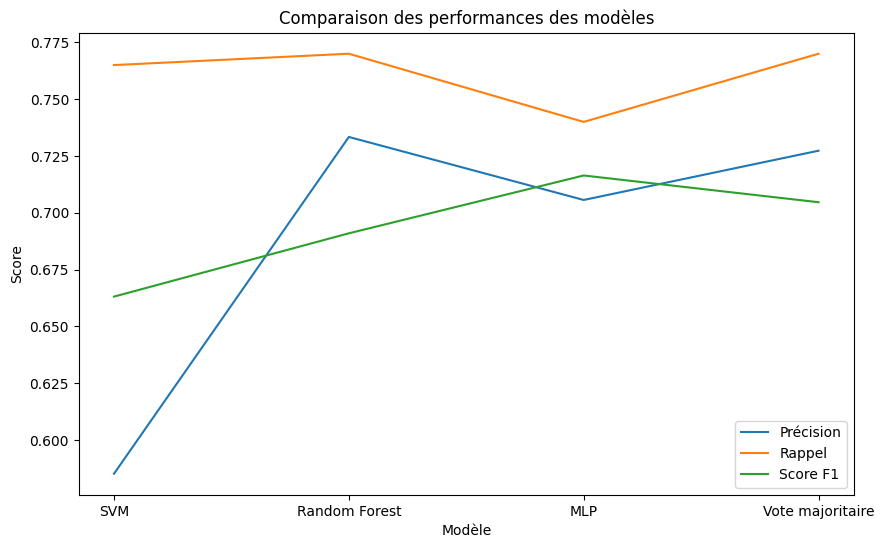

In [95]:
# Affichage d'un graphique comparatif
plt.figure(figsize=(10, 6))
models = ['SVM', 'Random Forest', 'MLP', 'Vote majoritaire']
precision_scores = [precision_svm, precision_rf, precision_mlp, precision_vote]
recall_scores = [recall_svm, recall_rf, recall_mlp, recall_vote]
f1_scores = [f1_svm, f1_rf, f1_mlp, f1_vote]

plt.plot(models, precision_scores, label='Précision')
plt.plot(models, recall_scores, label='Rappel')
plt.plot(models, f1_scores, label='Score F1')
plt.legend()
plt.xlabel('Modèle')
plt.ylabel('Score')
plt.title('Comparaison des performances des modèles')
plt.show()


In [96]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score


In [97]:
confusion = confusion_matrix(y_test_h, y_pred_vote)

In [98]:
# Affichage de la matrice de confusion
print("Matrice de confusion (Vote majoritaire):")
print(confusion)

Matrice de confusion (Vote majoritaire):
[[  5  42]
 [  4 149]]


In [99]:
# Calcul des scores de décision ou des probabilités de prédiction pour chaque modèle
svm_scores = svm_grid.decision_function(X_test_h)
rf_probs = rf_grid.predict_proba(X_test_h)[:, 1]
mlp_probs = mlp_grid.predict_proba(X_test_h)[:, 1]


In [100]:
# Calcul des taux de faux positifs et de vrais positifs pour chaque modèle
svm_fpr, svm_tpr, _ = roc_curve(y_test_h, svm_scores)
rf_fpr, rf_tpr, _ = roc_curve(y_test_h, rf_probs)
mlp_fpr, mlp_tpr, _ = roc_curve(y_test_h, mlp_probs)


In [101]:

# Calcul de l'aire sous la courbe ROC (AUC) pour chaque modèle
svm_auc = roc_auc_score(y_test_h, svm_scores)
rf_auc = roc_auc_score(y_test_h, rf_probs)
mlp_auc = roc_auc_score(y_test_h, mlp_probs)

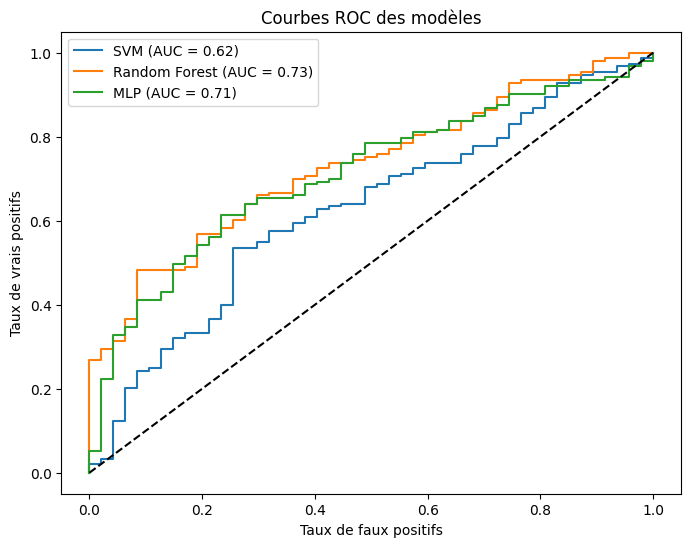

In [102]:
# Affichage des courbes ROC
plt.figure(figsize=(8, 6))
plt.plot(svm_fpr, svm_tpr, label='SVM (AUC = {:.2f})'.format(svm_auc))
plt.plot(rf_fpr, rf_tpr, label='Random Forest (AUC = {:.2f})'.format(rf_auc))
plt.plot(mlp_fpr, mlp_tpr, label='MLP (AUC = {:.2f})'.format(mlp_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbes ROC des modèles')
plt.legend()
plt.show()

In [103]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
import json

def preprocess_accident_data(accidents_data):
    accidents_data['descr_grav'] = accidents_data['descr_grav'].replace({
        'Indemne': 'pas grave',
        'Blessé léger': 'pas grave',
        'Blessé hospitalisé': 'grave',
        'Tué': 'grave'
    })
    columns_to_keep = ['descr_grav', 'latitude', 'longitude', 'descr_cat_veh',
                       'descr_agglo', 'descr_athmo', 'descr_lum', 'descr_etat_surf',
                       'descr_type_col']

    accidents_data = accidents_data[columns_to_keep]

    # Liste des colonnes à convertir
    columns_to_convert = ['descr_grav', 'descr_cat_veh', 'descr_agglo', 'descr_athmo', 'descr_lum',
                          'descr_etat_surf', 'descr_type_col']

    # Convertir les latitudes et longitudes en float
    accidents_data["latitude"] = accidents_data["latitude"].str.replace(',', '.')
    accidents_data["latitude"] = accidents_data["latitude"].astype(float)
    accidents_data["longitude"] = accidents_data["longitude"].str.replace(',', '.')
    accidents_data["longitude"] = accidents_data["longitude"].astype(float)

    # Création de l'objet LabelEncoder
    le = LabelEncoder()
    for var in columns_to_convert:
        accidents_data[var] = le.fit_transform(accidents_data[var])

    return accidents_data


def load_trained_models(models_folder):
    svm_clf = SVC()
    rf_clf = RandomForestClassifier()
    mlp_clf = MLPClassifier()

    svm_clf.load(models_folder + '/svm_model.pkl')
    rf_clf.load(models_folder + '/rf_model.pkl')
    mlp_clf.load(models_folder + '/mlp_model.pkl')

    return svm_clf, rf_clf, mlp_clf


def classify_accident(accident_info, models_folder):
    # Charger les modèles entraînés
    svm_clf, rf_clf, mlp_clf = load_trained_models(models_folder)

    # Prétraiter les informations de l'accident
    accident_data = pd.DataFrame.from_dict([accident_info], orient='columns')
    accident_data = preprocess_accident_data(accident_data)

    # Réorganiser les colonnes dans le jeu de données de test
    accident_data_reordered = accident_data[svm_clf.feature_names_]

    # Prédire la gravité de l'accident avec chaque modèle
    svm_prediction = svm_clf.predict(accident_data_reordered)
    rf_prediction = rf_clf.predict(accident_data_reordered)
    mlp_prediction = mlp_clf.predict(accident_data_reordered)

    # Convertir les prédictions en "grave" ou "pas grave"
    svm_predicted_class = "grave" if svm_prediction[0] == 0 else "pas grave"
    rf_predicted_class = "grave" if rf_prediction[0] == 0 else "pas grave"
    mlp_predicted_class = "grave" if mlp_prediction[0] == 0 else "pas grave"

    # Retourner les prédictions sous forme de JSON
    result = {
        'svm_predicted_class': svm_predicted_class,
        'rf_predicted_class': rf_predicted_class,
        'mlp_predicted_class': mlp_predicted_class
    }
    json_result = json.dumps(result)

    return json_result

# Exemple d'utilisation du script
accident_info = {
    'descr_cat_veh': 21,
    'descr_agglo': 1,
    'descr_lum': 4,
    'descr_athmo': 0,
    'descr_etat_surf': 8,
    'descr_type_col': 1,
    'latitude': 47.1167,
    'longitude': -2.1000
}  # Remplacez les features par les informations réelles de l'accident

models_folder = 'trained_models'  # Dossier contenant les modèles entraînés

predicted_classes_json = classify_accident(accident_info, models_folder)
print(predicted_classes_json)


AttributeError: ignored